## Setup Code

In [ ]:
!pip install kaggle pyyaml h5py torchmetrics
!mkdir ~/.kaggle
!chmod 600 ~/.kaggle
# For training, we will use a dataset consisting of 100 images designed for super resolution.
# The dataset can be found here: https://www.kaggle.com/datasets/akhileshdkapse/super-image-resolution
!echo "{\"username\":\"YOUR_KAGGLE_USERNAME_HERE!\",\"key\":\"YOUR_KAGGLE_KEY_HERE!\"}" > ~/.kaggle/kaggle.json
!kaggle datasets download -d akhileshdkapse/super-image-resolution
!mv ./super-image-resolution.zip ./data.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
mkdir: cannot create directory ‘/root/.kaggle’: File exists
 88% 24.0M/27.2M [00:00<00:00, 119MB/s]
100% 27.2M/27.2M [00:00<00:00, 130MB/s]


In [ ]:
import os
from zipfile import ZipFile
from tqdm import tqdm

def setup():
    # Let's specify the assignment path we will be working with as the root.
    root_dir = os.path.join('./')
    data_dir = os.path.join(root_dir, 'data')
    weights_dir = os.path.join(root_dir, 'weights')
    os.makedirs(data_dir, exist_ok=True)
    os.makedirs(weights_dir, exist_ok=True)

    # Open the .zip file and extract all folders into the './Data/images/' folder.
    with ZipFile("./data.zip", 'r') as data:
        for info in tqdm(iterable=data.infolist(), total=len(data.infolist()),\
                         unit="B", unit_scale=True, desc="Extracting .zip file"):
            info.filename = info.filename.replace('Data/', '')
            data.extract(info, os.path.join(data_dir, 'images'))
    return root_dir

In [ ]:
# High/low-resolution images located at 'data/images/HR' and 'data/images/LR/' 
# respectively.
root_dir = setup()

Extracting .zip file: 100%|██████████| 200/200 [00:00<00:00, 1.30kB/s]


### Define Utility Functions

In [ ]:
import torch
import numpy as np
from torchvision import transforms
from torchmetrics.functional import structural_similarity_index_measure

def tensor_to_image(image):
    'Converts a PyTorch tensor to a clipped numpy image.'
    tensor_image = image.clone().detach()
    image = tensor_image.permute(1, 2, 0).numpy()
    image = image * 0.5 + 0.5 if image.min() < 0 else image
    image = np.clip(image * 255, 0, 255).astype(np.uint8)
    
    return image

# Peak signal-to-noise ratio (PSNR) is the metric we use for image quality assessment.
def psnr(pred, label):
    'Calculates the peak signal-to-noise ratio between'
    mse = torch.mean((pred - label)**2)
    return 10 * torch.log10(1 / mse)

def ssim(pred, label):
    return structural_similarity_index_measure(pred, label)

##### **Define Content Loss**

In [ ]:
from torchvision import models
from torch import nn
from torch.nn import functional as F

class ContentLoss(nn.Module):
    def __init__(self, device):
        super(ContentLoss, self).__init__()
        vgg19 = models.vgg19(pretrained=True).to(device)
        for param in vgg19.parameters():
            param.requires_grad = False
        
        self.features = nn.Sequential(*list(vgg19.children())[0][:36])

    def forward(self, inputs_real, inputs_fake):
        real_features = self.features(inputs_real)
        fake_features = self.features(inputs_fake)

        return F.mse_loss(real_features, fake_features)

### Define Super Resolution Dataset

In [ ]:
import torch
import os
import h5py
from torch.utils.data import Dataset
from torchvision import transforms
from torchvision.transforms import InterpolationMode
from PIL import Image

class SuperResolution(Dataset):
    'Super Resolution dataset for PyTorch'
    def __init__(self, root_dir, split='train'):
        assert split in ['train', 'val']
        self.h5_dataset = split + '.h5'

    def __len__(self):
        'Denotes the total number of samples'
        with h5py.File(self.h5_dataset, 'r') as dataset:
            return len(dataset['lr'])

    def __getitem__(self, index):
        'Generates one sample of data'
        with h5py.File(self.h5_dataset, 'r') as dataset:
            return torch.from_numpy(dataset['lr'][index]),\
                   torch.from_numpy(dataset['hr'][index])

##### **Dataset Preperation**
The h5py package is a Pythonic interface to the HDF5 binary data format. Converting our image files into the HDF5 format yields a vastly more efficient sample retrieval during our training process (often 4-5x reduced training time alone).

In [ ]:
import numpy as np
import h5py
import os
from torchvision import transforms
from torchvision.transforms import InterpolationMode
from PIL import Image

# The h5py package is a Pythonic interface to the HDF5 binary data format.
# Converting our image files into the HDF5 format yields a vastly more efficient
# sample retrieval during our training process.
#   * This yields about a 4-5x performance increase alone.
def create_h5_dataset(root_dir, image_dir, split='train', scale=4):
    assert split in ['train', 'val']

    try:
        # Remove previous .h5 file if it exists
        os.remove(os.path.join(root_dir, split + '.h5'))
    except OSError:
        pass

    # Resize the image with bicubic downsampling
    resize = lambda size: transforms.Resize(size, interpolation=InterpolationMode.BICUBIC)

    create_lr = transforms.Compose([resize(384 // scale)])
    # Unlike SRCNN, we don't upsample the LR image.
    to_tensor = transforms.Compose([transforms.ToTensor()])

    lr_samples, hr_samples = [], []
    with h5py.File(os.path.join(root_dir, split + '.h5'), 'w') as dataset:
        # Get a sorted list of all files within 'image_dir'
        image_paths = sorted([i for i in os.listdir(image_dir)], key=lambda x: x.split('.')[0])
        for image_path in tqdm(iterable=image_paths, total=len(image_paths), desc="Creating .h5 file"):
            hr_image = Image.open(os.path.join(image_dir, image_path))
            lr_image = create_lr(hr_image) # Bicubic downsampling of HR image

            lr_image = to_tensor(lr_image)
            # We normalize the HR image to be in [-1, 1] so that the MSE loss is
            # between [-1, 1] (as done in the paper).
            hr_image = 2 * to_tensor(hr_image) - 1

            if split == 'train':
                # For train dataset, we extract 32x32 image patches with stride
                # of 16. The overlap reduces harsh boundaries in upscaled images
                k = 96
                for i in range(0, 384 - k + 1, 16):
                    for j in range(0, 384 - k + 1, 16):
                        ii, jj, kk = i//scale, j//scale, k//scale
                        lr_samples.append(lr_image[:, ii:ii + kk, jj:jj + kk].numpy())
                        hr_samples.append(hr_image[:, i:i + k, j:j + k].numpy())
            elif split == 'val':
                # For validation dataset, we just use the full size images
                lr_samples.append(lr_image.numpy())
                hr_samples.append(hr_image.numpy())
        dataset.create_dataset('lr', data=np.array(lr_samples))
        dataset.create_dataset('hr', data=np.array(hr_samples))

In [ ]:
create_h5_dataset('./', './data/images/HR/', split='train', scale=3)
create_h5_dataset('./', './data/images/HR/', split='val', scale=3)

Creating .h5 file: 100%|██████████| 100/100 [00:01<00:00, 76.98it/s]


### Define Train and Evaluation Methods

In [ ]:
from tqdm import tqdm

def train(model, train_loader, val_loader, optimizer, criterion, device, num_epochs):
    """
    Train the model on the training set and evaluate it on the validation set every epoch.
    """
    model = model.to(device) # Place model on device
    loss_history = []
    for epoch in range(num_epochs):
        model.train()  # Set model to training mode

        # Use tqdm to display a progress bar during training
        with tqdm(total=len(train_loader), desc=f'Epoch {epoch + 1}/{num_epochs}') as pbar:
            for inputs, labels in train_loader:
                # Move inputs and labels to device
                inputs = inputs.to(device)
                labels = labels.to(device)
                
                optimizer.zero_grad()  # Zero out gradients      
                logits = model(inputs) # Compute the logits and loss
                loss = criterion(logits, labels)
                
                loss.backward()  # Backpropagate the loss
                optimizer.step() # Update the weights  
                pbar.update(1)   # Update the progress bar
                pbar.set_postfix(loss=loss.item())
        
        # Evaluate the model on the validation set
        avg_losses = evaluate(model, val_loader, [criterion, psnr, ssim], device)
        loss_history.append(avg_losses)
        print(f'Validation set: average psnr/ssim = {avg_losses[1]:.4f}/{avg_losses[2]:.4f}')
        
        # Save model weights creating a backup of previously saved
        torch.save(model.state_dict(), os.path.join(root_dir, 'weights', f'srresnet_weights_epoch{epoch}.pth'))
    return loss_history



def train_gan(generator, discriminator, train_loader, val_loader, gen_optimizer, dis_optimizer, 
              pixel_criterion, content_criterion, adversarial_criterion, device, num_epochs):
    """
    Train the model on the training set and evaluate it on the validation set every epoch.
    """
    # Place generator and discriminator on device
    generator = generator.to(device)
    discriminator = discriminator.to(device)
    loss_history = []
    for epoch in range(num_epochs):
        # Set generator and discriminator to training mode
        generator.train()
        discriminator.train()

        # Use tqdm to display a progress bar during training
        with tqdm(total=len(train_loader), desc=f'Epoch {epoch + 1}/{num_epochs}') as pbar:
            for inputs, labels in train_loader:      
                batch_size = labels.shape[0]   

                # Fake samples will be generated using the generator from the input
                inputs_real = labels.to(device, non_blocking=True)
                inputs_fake = generator(inputs.to(device, non_blocking=True))
                # Labels will just be a 1-D tensor mapping all real and generated 
                # samples to 1 and 0.
                labels_real = torch.full((batch_size,), 1.0).to(device)
                labels_fake = torch.full((batch_size,), 0.0).to(device)
                
                ################################################################
                # Training discriminator
                ################################################################        
                dis_optimizer.zero_grad() # Zero out gradients  
                real_prob = discriminator(inputs_real)
                fake_prob = discriminator(inputs_fake)

                discriminator_loss =\
                    adversarial_criterion(real_prob, labels_real) +\
                    adversarial_criterion(fake_prob, labels_fake)
                
                discriminator_loss.backward(retain_graph=True) # Backpropagate the loss
                dis_optimizer.step()                           # Update the weights  

                ################################################################
                # Training generator
                ################################################################
                gen_optimizer.zero_grad() # Zero out gradients  
                perceptual_loss =\
                    1e-0 * pixel_criterion(inputs_fake, inputs_real) +\
                    6e-3 * content_criterion(inputs_fake, inputs_real) +\
                    1e-3 * adversarial_criterion(fake_prob.detach(), labels_real)

                perceptual_loss.backward() # Backpropagate the loss
                gen_optimizer.step()       # Update the weights 

                pbar.update(1)             # Update the progress bar
                pbar.set_postfix({
                    'd/p_loss': f'{discriminator_loss:.3f}/{perceptual_loss.item():.3f}'
                })
        
        # Evaluate the generator on the validation set
        avg_losses = evaluate(generator, val_loader, [pixel_criterion, psnr, ssim], device)
        loss_history.append(avg_losses)
        print(f'Validation set: average generator psnr/ssim = {avg_losses[1]:.4f}/{avg_losses[2]:.4f}')
        
        # Save generator weights creating a backup of previously saved
        torch.save(generator.state_dict(), os.path.join(root_dir, 'weights', f'srgan_generator_weights_epoch{epoch}.pth'))
        torch.save(discriminator.state_dict(), os.path.join(root_dir, 'weights', f'srgan_discriminator_weights_epoch{epoch}.pth'))
    return loss_history



def evaluate(model, test_loader, criterions, device):
    """
    Evaluate the model on the test set.
    """
    model.eval()  # Set model to evaluation mode
    
    with torch.no_grad():
        total_losses = [0.0]*len(criterions)
        
        for inputs, labels in test_loader:
            # Move inputs and labels to device
            inputs = inputs.to(device)
            labels = labels.to(device)

            logits = model(inputs).clamp(0.0, 1.0)
            for i in range(len(criterions)):
                loss = criterions[i](logits, labels)
                total_losses[i] += loss

    # Compute the average loss and accuracy
    avg_losses = [0.0]*len(criterions)
    for i in range(len(criterions)):
        avg_losses[i] = (total_losses[i] / len(test_loader)).item()
                
    return tuple(avg_losses)


#####**Testing the Dataset** 
We display randomly selected low-resolution samples along with their high-resolution counterpart. Later we will compare these with the super-resolution counterpart generated by the SRCNN model.

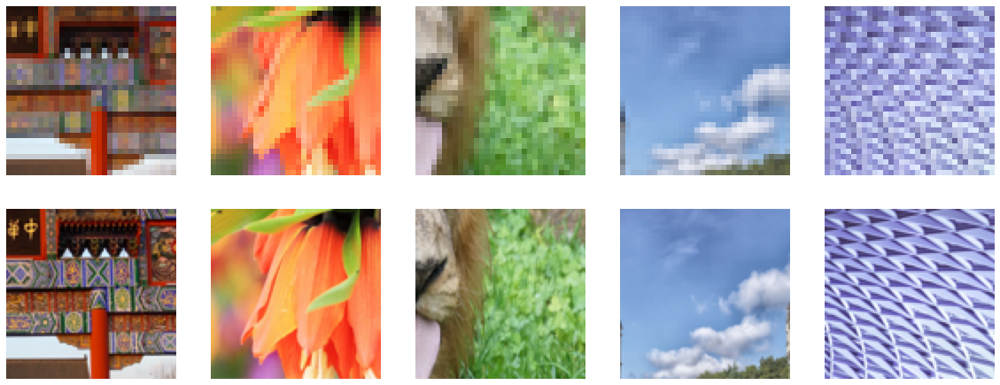

In [ ]:
import matplotlib.pyplot as plt

example_dataset = SuperResolution(os.path.join(root_dir, 'data'))
figure = plt.figure(figsize=(20, 7.75))
cols, rows, samples = 2, 5, []
for _ in range(5):
    sample_idx = torch.randint(len(example_dataset), size=(1,)).item()
    samples.append(example_dataset[sample_idx])

for i in range(1, rows * cols + 1):
    img = samples[i - 1][0] if i < rows + 1 else samples[i % rows - 1][1]
    figure.add_subplot(cols, rows, i)
    plt.axis("off")
    plt.imshow(tensor_to_image(img))
plt.show()

## SRGAN



### Define the SRGAN Model

##### **Define the Generator (SRResNet)**

In [ ]:
  from torch import nn

################################################################################
# Helper Modules
################################################################################
class ResidualBlock(nn.Module):
    def __init__(self, channels, depth):
      super(ResidualBlock, self).__init__()
      self.residual_blocks = nn.ModuleList([nn.Sequential(
          nn.Conv2d(channels, channels, kernel_size=3, stride=1, padding=1, bias=False),
          nn.BatchNorm2d(channels),
          nn.PReLU(),
          nn.Conv2d(channels, channels, kernel_size=3, stride=1, padding=1, bias=False),
          nn.BatchNorm2d(channels),
      ) for _ in range(depth)])
    
    def forward(self, x):
        for residual_block in self.residual_blocks:
            x = residual_block(x) + x
        return x



class UpsampleBlock(nn.Module):
    def __init__(self, in_channels, upsample_scale):
        super(UpsampleBlock, self).__init__()
        factor = 2 if upsample_scale % 2 == 0 else upsample_scale 
        self.upsample_blocks = nn.ModuleList([nn.Sequential(
            nn.Conv2d(in_channels, in_channels * factor**2, kernel_size=3, stride=1, padding=1),
            nn.PixelShuffle(factor),
            nn.PReLU(),
        ) for _ in range(upsample_scale // 2)])
    
    def forward(self, x):
        for upsample_block in self.upsample_blocks:
            x = upsample_block(x)
        return x



################################################################################
# SRResNet Model
################################################################################
class SRResNet(nn.Module):
    def __init__(self, res_depth=16, upsample_scale=4):
        super(SRResNet, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, stride=1, padding=9 // 2),
            nn.PReLU(),
        )
        self.encoder = nn.Sequential(
            ResidualBlock(64, res_depth),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
        )
        self.decoder = nn.Sequential(
            UpsampleBlock(64, upsample_scale),
            nn.Conv2d(64, 3, kernel_size=9, stride=1, padding=9 // 2)
        )

    def forward(self, x):
        x = self.conv(x)
        x = self.encoder(x) + x
        x = self.decoder(x)
        return x

##### **Define the Discriminator**

In [ ]:
################################################################################
# Helper Modules
################################################################################
class DiscriminatorBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DiscriminatorBlock, self).__init__()
        stride = 2 if in_channels == out_channels else 1
        self.features = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1), 
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True),
        )
    
    def forward(self, x):
        x = self.features(x)
        return x



################################################################################
# Discriminator Model
################################################################################        
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.conv = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1)
        self.features = nn.Sequential(
            DiscriminatorBlock(64,  64),
            DiscriminatorBlock(64,  128),
            DiscriminatorBlock(128, 128),
            DiscriminatorBlock(128, 256),
            DiscriminatorBlock(256, 256),
            DiscriminatorBlock(256, 512),
            DiscriminatorBlock(512, 512),
        )
        self.classifier = nn.Sequential(
            nn.Linear(18432, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 1),
        )
        self.lrelu = nn.LeakyReLU(0.2, inplace=True)

    def forward(self, x):
        batch_size = x.shape[0]

        x = self.lrelu(self.conv(x))
        x = self.features(x)
        x = x.flatten(1)
        x = self.classifier(x)
        return torch.sigmoid(x.view(batch_size))

### Training the SRGAN Model

In [ ]:
# Define the device to use for training
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if device == torch.device('cuda'):
    print(f'Using device: {device}. Good to go!')
else:
    print('Please set GPU via Edit -> Notebook Settings.')

Using device: cuda. Good to go!


In [ ]:
if device == torch.device('cuda'):
    torch.cuda.empty_cache()

# Define the batch size and number of workers
batch_size = 64
num_workers = 2

data_root = os.path.join(root_dir, 'data')
srgan_train_dataset = SuperResolution(data_root, split='train')
srgan_val_dataset = SuperResolution(data_root, split='val')

srgan_train_loader = torch.utils.data.DataLoader(
    srgan_train_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=True)
srgan_val_loader = torch.utils.data.DataLoader(
    srgan_val_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=False)

# Define the model, optimizer, and criterion (loss_fn)
generator = nn.DataParallel(SRResNet(upsample_scale=3))
discriminator = nn.DataParallel(Discriminator())

# SRCNN Paper uses 1e-4 for the first two conv layers and 1e-5 for the last conv 
# layer.
# TODO: Add learning rate scheduling maybe
generator_optimizer = torch.optim.Adam(generator.parameters(), lr=1e-5)
discriminator_optimizer = torch.optim.Adam(discriminator.parameters(), lr=1e-5)

pixel_loss = nn.MSELoss()
content_loss = ContentLoss(device=device)
adversarial_loss = nn.BCELoss()

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
!wget -qN https://github.com/2Retr0/CS188-Final-Project/raw/main/srresnet_pretrained_weights_e90.pth
!wget -qN https://github.com/2Retr0/CS188-Final-Project/raw/main/srgan_generator_pretrained_weights_e20.pth
!wget -qN https://github.com/2Retr0/CS188-Final-Project/raw/main/srgan_discriminator_pretrained_weights_e20.pth

pretrained = True

##### **Pretraining SRResNet**
We pretrain SRResNet for 90 epochs to avoid undesired local minima when training SRGAN.

In [ ]:
# Pretrain the SRResNet model for ~90 epochs.
if not pretrained:
    print(80*'#' + '\n# Pretraining SRResNet\n' + 80*'#')
    srresnet_history = train(generator, srgan_train_loader, srgan_val_loader, generator_optimizer, pixel_loss, device, num_epochs=90)
    print("Loss History:", srresnet_history)
else:
    srresnet = nn.DataParallel(SRResNet(upsample_scale=3)).to(device)
    srresnet.load_state_dict(torch.load('srresnet_pretrained_weights_e90.pth'))

##### **Training SRGAN**
We then train SRGAN (i.e. further train SRResNet with a discriminator) for an additional ~20 epochs.

In [ ]:
# Train the SRGAN model for ~20 epochs.
if not pretrained:
    print('\n' + 80*'#' + '\n# Training SRGAN\n' + 80*'#')
    srgan_history = train_gan(generator, discriminator, srgan_train_loader, srgan_val_loader, 
        generator_optimizer, discriminator_optimizer, pixel_loss, content_loss, 
        adversarial_loss, device, num_epochs=20)
    print("Loss History:", srgan_history)
else:
    generator.load_state_dict(torch.load('srgan_generator_pretrained_weights_e20.pth'))
    discriminator.load_state_dict(torch.load('srgan_discriminator_pretrained_weights_e20.pth'))

### Testing the SRGAN Model
We display randomly selected low-resolution samples along with its super-resolution (SRCNN-generated) and high-resolution (ground-truth) image counterparts.

In [ ]:
def display_samples(zoom_in=False):
    generator.eval()
    discriminator.eval()
    if srresnet: srresnet.eval()

    figure = plt.figure(figsize=(50, 40) if srresnet else (40, 24))
    cols, rows, samples = 4 if srresnet else 3, 5, []
    for _ in range(5):
        sample_idx = torch.randint(len(srgan_val_dataset), size=(1,)).item()
        (lr_image, hr_image), sr_image = srgan_val_dataset[sample_idx], None

        lr_image = lr_image.unsqueeze(0)
        with torch.no_grad():
            sr_image = generator(lr_image.to(device)).cpu()
            sr_image = torch.clip(sr_image, min=0.0)

            if srresnet:     
                sr_image2 = srresnet(lr_image.to(device)).cpu()
                sr_image2 = torch.clip(sr_image2, min=0.0)

            lr_image = transforms.Resize(384, interpolation=InterpolationMode.BICUBIC)(lr_image)
            lr_image = torch.clip(lr_image, min=0)
        if srresnet:
            samples.append((lr_image, sr_image2, sr_image, hr_image))
        else:
            samples.append((lr_image, sr_image, hr_image))

    for i in range(1, rows * cols + 1):
        img = samples[i % rows - 1][(i - 1) // rows]
        if zoom_in:
            img = torchvision.transforms.CenterCrop(100)(img)
        figure.add_subplot(cols, rows, i)
        plt.axis("off")
        plt.imshow(tensor_to_image(img.squeeze(0)))
    plt.show()

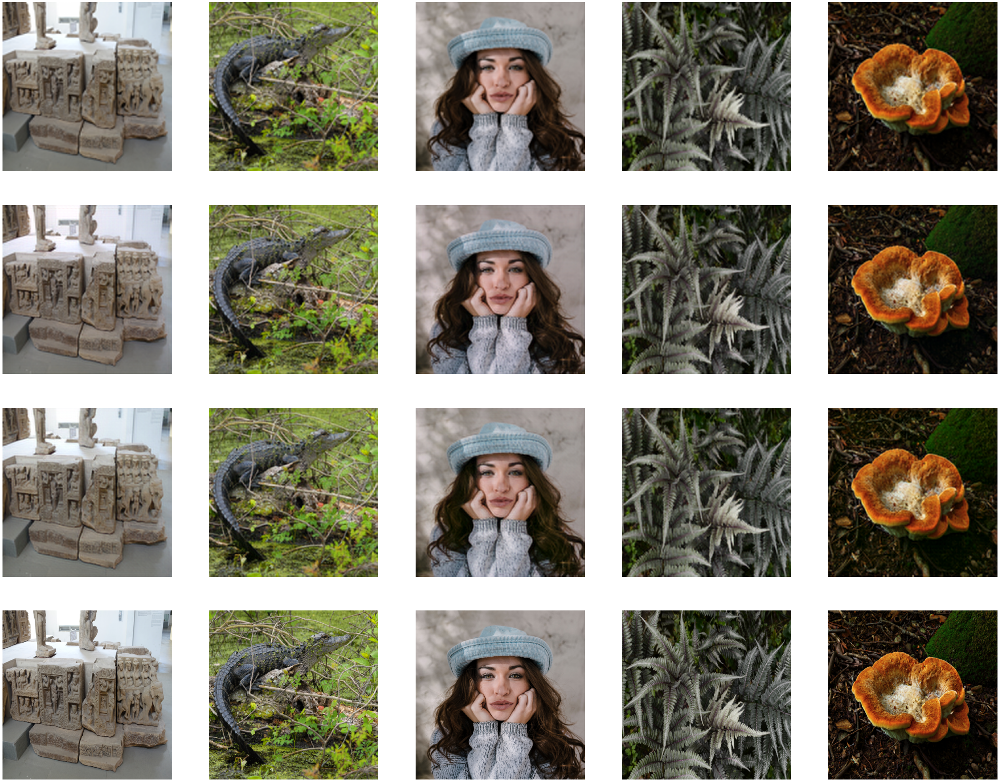

In [ ]:
display_samples(zoom_in=False)

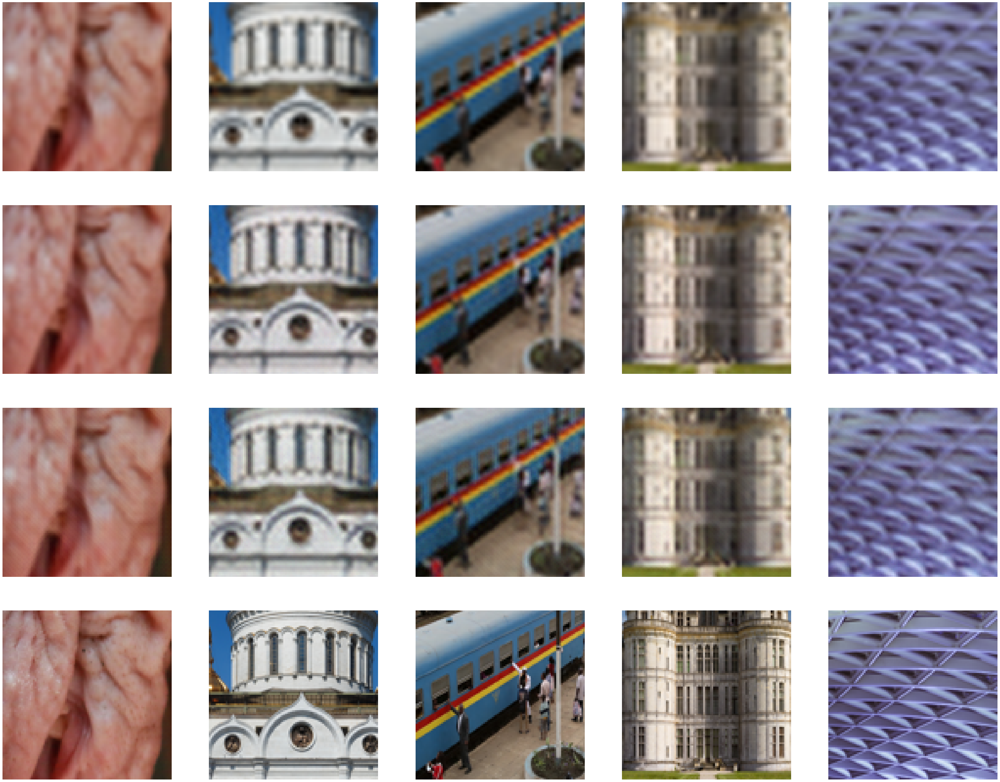

In [ ]:
# import numpy as np

# for i in range(5):

#   size = 100
#   _, h, w = lr.shape

#   x = np.random.randint(0, w - size)
#   y = np.random.randint(0, h - size)

#   lr_crop = lr[:, x:x+size, y:y+size]
#   sr_crop = sr[:, x:x+size, y:y+size]

#   plt.subplot(1, 2, 1)

#   plt.imshow(tensor_to_image(lr_crop))

#   plt.subplot(1, 2, 2)
#   plt.imshow(tensor_to_image(sr_crop))
  
#   plt.show()



# lr, sr, hr = samples[-1]

# resize = lambda size: transforms.Resize((size, size), interpolation=InterpolationMode.BICUBIC)
# create_lr = transforms.Compose([resize(384)])

# lr = create_lr(lr)

# lr= lr[0]
# sr = sr[0]
# hr = hr[0]

# print

# plt.axis('off')
# plt.imshow(tensor_to_image(lr))
# plt.show()

# plt.axis('off')
# plt.imshow(tensor_to_image(sr))
# plt.show()

display_samples(zoom_in=True)

##### **Using Our Own Images**
Now the fun part! We want to test the model on our own images to see how well we can super-resolve them.

In [ ]:
# resize = lambda size: transforms.Resize((size, size), interpolation=InterpolationMode.BICUBIC)
# to_tensor = transforms.Compose([resize(384), transforms.ToTensor()])

# samples = []

# figure = plt.figure(figsize=(24, 15))

# for _, _, images in os.walk('./our_images'):
#   for image_path in images:
#     img = Image.open(os.path.join('./our_images', image_path))
#     img = img.convert('RGB')
#     img = to_tensor(img)
    
#     with torch.no_grad():
#       sr_image = srcnn(img.to('cuda')).cpu()
#     # print(img.shape, sr_image.shape)
#     samples.append((img, sr_image))


# cols, rows = 2, len(samples)

# for i in range(1, rows * cols + 1):
#     img = samples[i % rows - 1][(i - 1) // rows]
#     figure.add_subplot(cols, rows, i)
#     plt.axis("off")
#     plt.imshow(tensor_to_image(img))
# plt.show()
